# Stage 1 — OP robustness with linear CKA
This replaces the separate CKA compute and plotting programs. It measures how stable the learned representation is across optical-property transitions and saves PNG figures only.

In [1]:
from pathlib import Path
import os, subprocess, sys
ROOT = Path.cwd()
if not (ROOT / 'pyproject.toml').is_file():  # VS Code may start in notebooks/
    ROOT = ROOT.parent
if not (ROOT / 'pyproject.toml').is_file():
    raise RuntimeError('Open this notebook from final_refactored or its notebooks folder.')
os.chdir(ROOT)
SRC_DIR = ROOT / 'src'
sys.path.insert(0, str(SRC_DIR))
SUBPROCESS_ENV = os.environ.copy()
SUBPROCESS_ENV['PYTHONPATH'] = str(SRC_DIR) + os.pathsep + SUBPROCESS_ENV.get('PYTHONPATH', '')
EXPERIMENT = 'relat_cons_32'
DATA_DIR = Path('data/raw/stage1')
RESULT_ROOT = Path('artifacts/stage1')
OUTPUT_DIR = Path('results/tables/stage1') / f'cka_{EXPERIMENT}'

## Compute CKA
For each OP pair, linear CKA compares the centered subject-by-feature matrices. Values near one indicate that pairwise subject geometry is preserved.

In [2]:
subprocess.run([sys.executable, '-m', 'subject_nirs.stage1.cka', '--data_dir', str(DATA_DIR), '--result_root', str(RESULT_ROOT), '--experiment', EXPERIMENT, '--output_dir', str(OUTPUT_DIR)], cwd=ROOT, env=SUBPROCESS_ENV, check=True)

Found 154 fold(s); 0 require inference; device=cuda, amp=False
Aggregating full OP-pair CKA matrix...
  wrote full CKA matrix: 2700 x 2700
Endpoint sensitivity ranking (lowest mean CKA = most sensitive):
  1. mu_s_skull: 0.879406 (100→200)
  2. mu_s_scalp: 0.917104 (130→200)
  3. mu_a_scalp: 0.940304 (0.12→0.32)
  4. mu_s_gm: 0.940420 (80→240)
  5. mu_a_gm: 0.965725 (0.12→0.22)
  6. mu_a_skull: 0.975548 (0.1→0.16)
Saved Figures 1-3 as 300 dpi PNG
Analysis complete: /media/md703/PNY_Gen4_4TB/YC/Research/final_refactored/results/tables/stage1/cka_relat_cons_32


CompletedProcess(args=['/home/md703/.conda/envs/yc_ae/bin/python', '-m', 'subject_nirs.stage1.cka', '--data_dir', 'data/raw/stage1', '--result_root', 'artifacts/stage1', '--experiment', 'relat_cons_32', '--output_dir', 'results/tables/stage1/cka_relat_cons_32'], returncode=0)

## Inspect the compact transition summary

,parameter,family,transition,low_level_index,high_level_index,is_endpoint,matched_pair_count,num_folds,mean_cka,fold_sd,fold_median,fold_q05,fold_q25,fold_q75,fold_q95,pair_cross_fold_q05,pair_cross_fold_q95
0,mu_a_scalp,absorption,0.12→0.17,0,1,False,540,154,0.993830,0.002943,0.994624,0.988554,0.992102,0.996012,0.997287,0.992344,0.995254
1,mu_a_scalp,absorption,0.17→0.22,1,2,False,540,154,0.995621,0.002028,0.996113,0.991590,0.994474,0.997250,0.997894,0.994642,0.996590
2,mu_a_scalp,absorption,0.22→0.27,2,3,False,540,154,0.996763,0.001412,0.997094,0.994187,0.995887,0.997937,0.998391,0.996048,0.997491
3,mu_a_scalp,absorption,0.27→0.32,3,4,False,540,154,0.997529,0.001014,0.997710,0.995660,0.996761,0.998362,0.998799,0.996982,0.998100
4,mu_a_scalp,absorption,0.12→0.32,0,4,True,540,154,0.940304,0.025906,0.945851,0.889682,0.923021,0.961613,0.970165,0.928110,0.952777
5,mu_a_skull,absorption,0.1→0.115,0,1,False,540,154,0.998133,0.000821,0.998291,0.996639,0.997698,0.998698,0.999108,0.997365,0.998849
6,mu_a_skull,absorption,0.115→0.13,1,2,False,540,154,0.998332,0.000695,0.998470,0.997027,0.998002,0.998814,0.999175,0.997689,0.998950
7,mu_a_skull,absorption,0.13→0.145,2,3,False,540,154,0.998483,0.000599,0.998561,0.997408,0.998197,0.998917,0.999210,0.997945,0.999040
8,mu_a_skull,absorption,0.145→0.16,3,4,False,540,154,0.998576,0.000539,0.998648,0.997676,0.998342,0.998954,0.999265,0.997922,0.999118
9,mu_a_skull,absorption,0.1→0.16,0,4,True,540,154,0.975548,0.009694,0.976782,0.957433,0.970893,0.982434,0.987559,0.966823,0.984406


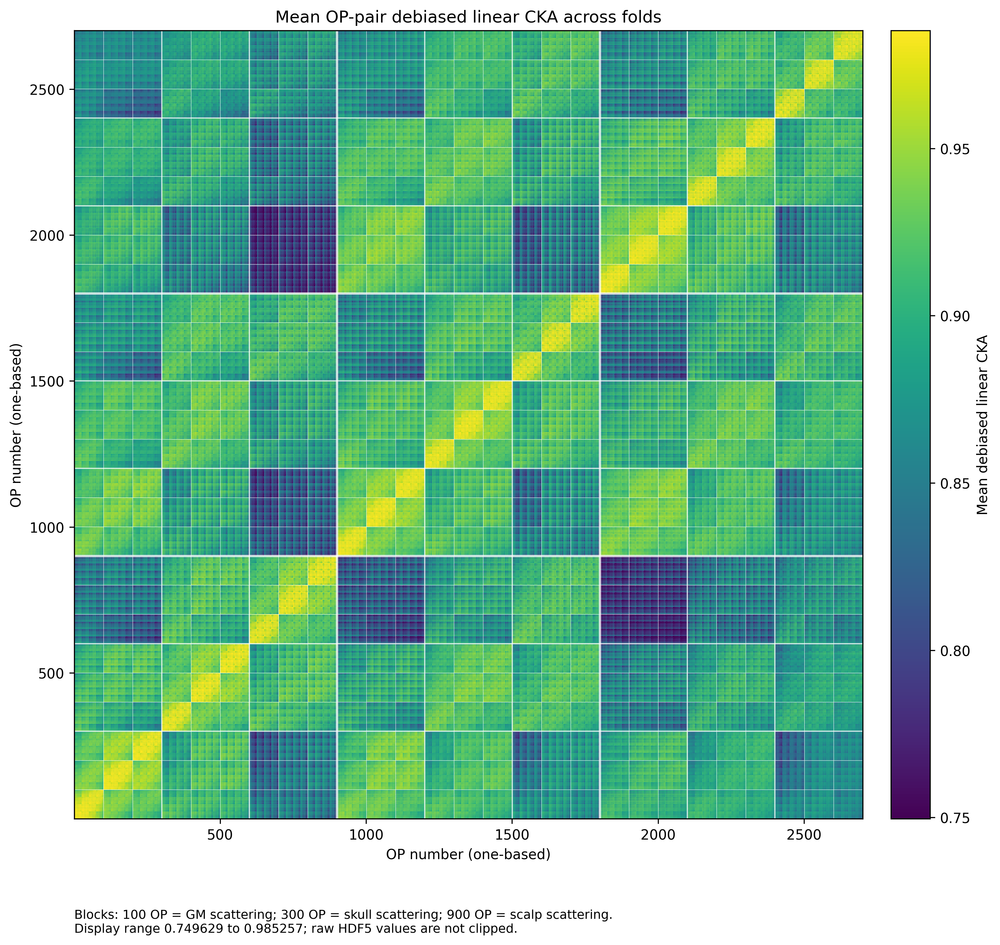

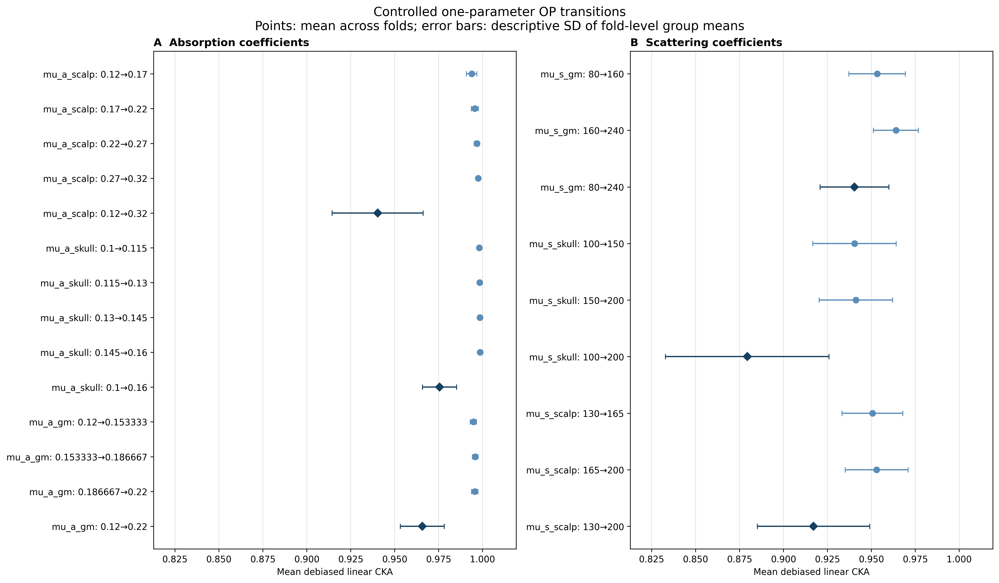

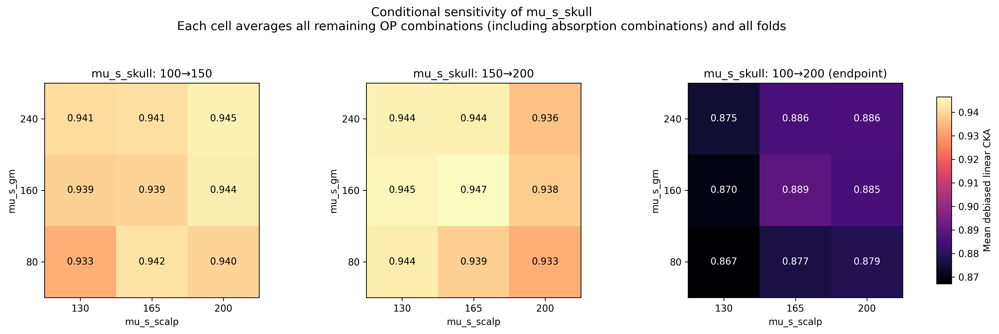

In [3]:
import pandas as pd
from IPython.display import Image, display

summary = pd.read_csv(OUTPUT_DIR / 'op_transition_summary.csv')
display(summary)
for figure_path in sorted(OUTPUT_DIR.glob('*.png')):
    display(Image(filename=str(figure_path), width=1100))
